In [1]:
import warnings
warnings.filterwarnings("ignore")
#warnings.filterwarnings("default")
import logging
logging.getLogger('numba.core.byteflow').setLevel(logging.WARNING)
logging.getLogger("fsspec").setLevel(logging.WARNING)

In [2]:
# Data analysis
import geopandas as gpd
import numpy as np
import pandas as pd
import intake
import dask
from shapely.geometry import Point

# Plotting
import seaborn as sns
from matplotlib import pyplot as plt
import altair as alt
import holoviews as hv
import hvplot.pandas
import geoviews as gv
import geoviews.tile_sources as gvts
import datashader as ds
import datashader.transfer_functions as tf
from datashader.colors import Greys9, viridis, inferno
from colorcet import fire, kgy, CET_CBL3

# Sci-Kit Learn
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.cluster import KMeans

pd.options.display.max_columns = 999

## Part 1 - Global Cell Tower Insights: Mapping, Networks, and Country Metrics

### Global Tower Topography: Visualizing The Networks Of Cell Connectivity
First and foremost, we start with visualizing cell tower coverage across the world. The [OpenCellID](https://opencellid.com) database has a dataframe with over 200 million observations of cell towers, which we aggregate and plot using Intake, Dask, and Datashader - parallel computing and data loading plugins for Python. We observe regions with high concentrations of cell towers located primarily in the United States, most of Europe, Japan, and South Korea. We notice dark spots in Central Africa, South America, West Asia, and rural China. The high concentration of cell towers in certain regions reflects not only technological advancement but also economic and urban development. Conversely, the observable gaps in Central Africa, South America, West Asia, and rural China hint at the challenges and disparities in extending telecommunication infrastructure to more remote and less economically developed regions. This understanding of cell tower distribution highlights the interconnectedness of technology, geography, and socio-economic factors on a global scale.

In [3]:
ctw = intake.open_csv('./Data/cell_towers.csv')
ddf = ctw.to_dask()

In [4]:
max_lon = ddf['lon'].max().compute()
min_lon = ddf['lon'].min().compute()
max_lat = ddf['lat'].max().compute()
min_lat = ddf['lat'].min().compute()

print(f"Max Longitude: {max_lon}, Min Longitude: {min_lon}")
print(f"Max Latitude: {max_lat}, Min Latitude: {min_lat}")

Max Longitude: 179.9732208252, Min Longitude: -179.9732208252
Max Latitude: 78.334579467773, Min Latitude: -54.936431


In [5]:
global_x_range = (-179.9732208252, 179.9732208252)
global_y_range = (-54.936431, 78.334579467773)

# Default width and height
global_plot_width = 900
global_plot_height = int(global_plot_width*0.5)

In [6]:
canvas = ds.Canvas(
    plot_width=global_plot_width,
    plot_height=global_plot_height,
    x_range=global_x_range,
    y_range=global_y_range,
)

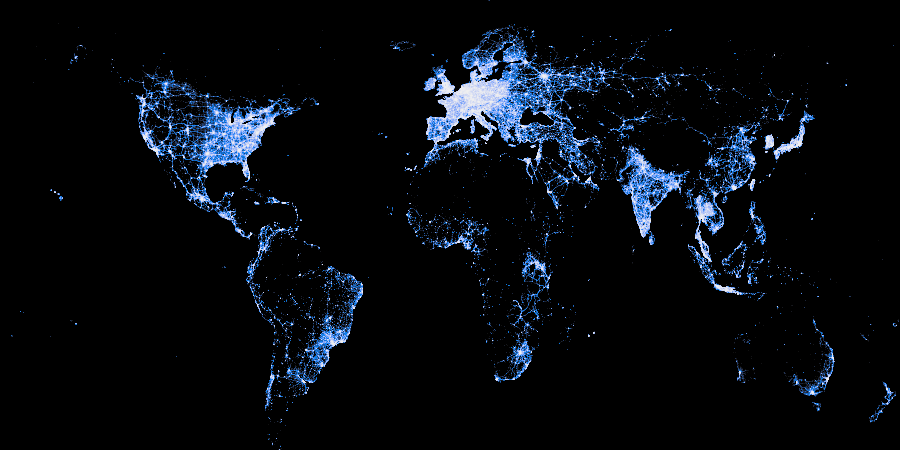

In [7]:
agg = canvas.points(ddf, "lon", "lat", agg=ds.count())
selected = agg.where(agg > 15)
tf.set_background(tf.shade(selected, cmap=CET_CBL3),"black")

Next, we can take a closer look at the differences across global cell networks based on the radio system type. This can help us understand the difference in advancement of ICT across different countries. These radio systems are commonly recognized for their roles in supporting mobile networks categorized as "2G," "3G," or "4G." According to the article titled "Difference Between Cellular Technologies: GSM, CDMA, UMTS, and LTE" by [Wilson Amplifiers](https://www.wilsonamplifiers.com/blog/difference-between-cellular-technologies-gsm-cdma-umts-and-lte/):

- **GSM** is the standard radio system supporting **2G network**
- **CDMA** is a competitor to GSM also supporting **2G network**
- **UMTS** of the GSM network supports **3G network**
- **LTE** migrates CDMA/CDMA2000 and GSM/UMTS into the **4G network**
- **NR** is a "New Radio" technology supporting **5G network**

In this visualization, one can observe that a significant number of global cell towers employ the UMTS radio system, providing support for 3G mobile data. Additionally, specific concentrations of LTE are evident in regions such as the United States, India, East Asia, and Europe.

In [8]:
ddf['radio'] = ddf['radio'].astype('category')
color_key = {"GSM": "#707390",
             "CDMA": "#93b7be",
             "UMTS": "#e0ca3c",
             "LTE": "#b59ab8",
             "NR": "#048a81"}

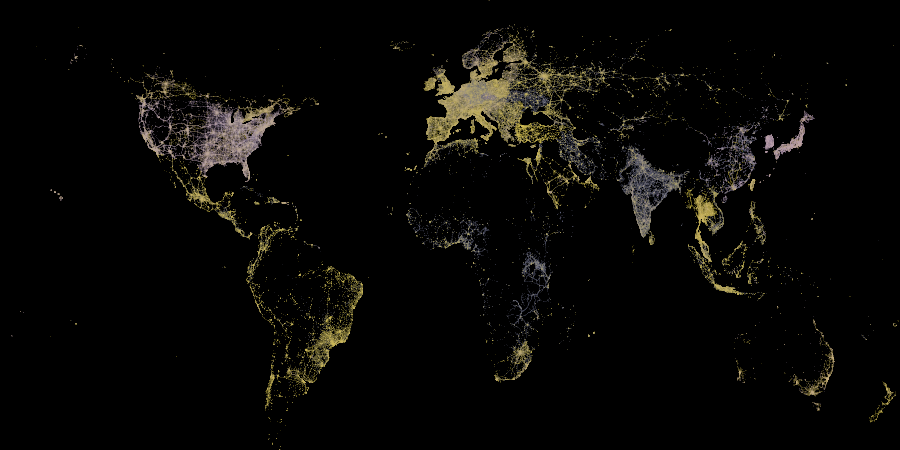

In [9]:
agg = canvas.points(ddf, "lon", "lat", agg=ds.count_cat("radio"))
selected = agg.where(agg > 15)
tf.set_background(tf.shade(selected, color_key=color_key),"black")

In [10]:
legend_df = pd.DataFrame(list(color_key.items()), columns=["radio", "color"])


legend = (alt.Chart(legend_df)
    .mark_rect(stroke="black", strokeWidth=1)
    .encode(
        y=alt.Y("radio:N", axis=alt.Axis(title=""), sort=alt.SortField("index")),
        color=alt.Color("color:N", legend=None, scale=None),
      #  tooltip=["radio", "color"]
    )
    .properties(width=100, height=120, title="Radio Systems Guide"))

legend

alt.Chart(...)

### Dominant Types of Global Cell Tower Technologies

Considering the variations in cell tower types, let's explore the differences in alignment with the country metrics - population and per capita GDP. This analysis aims to examine the correlation between cell tower coverage, type, and the developmental status of countries. In addition to using data from [OpenCellID](https://opencellid.com), we incorporate information from the [World Bank](https://databank.worldbank.org/reports.aspx?source=2&series=NY.GDP.PCAP.CD&country=#). The determination of a 'dominant cell type' for each country is based on the most prevalent type of cell tower within that nation. Unfortunately, there is no available data on NR (new radio, 5G). The following map depicts the most prevalent cell tower type in each country, providing insight into the technological advancement of their cell tower infrastructure. Noteworthy findings include China, the United States, Norway, Australia, and Japan leading with 4G LTE technology. It's also important to note that not all countries have sufficient data and thus, excluded from our analysis.

In [11]:
gdp_per_capita = pd.read_csv("./Data/gdp_per_capita.csv") #data from world bank
gdp_per_capita = gdp_per_capita[['Country Name', '2021 [YR2021]']]
gdp_per_capita = gdp_per_capita.rename(columns={
    'Country Name': 'country',
    '2021 [YR2021]': 'gdp_per_capita'
})
gdp_per_capita = gdp_per_capita.dropna(subset=['country'])
population = pd.read_csv("./data/population.csv") #data from world bank
population = population[['Country Name', '2021 [YR2021]']]
population = population.rename(columns={
    'Country Name': 'country',
    '2021 [YR2021]': 'population'
})
population = population.dropna(subset=['country'])
gpc_pop = population.merge(gdp_per_capita, how='left', on='country')

In [12]:
countries = gpd.read_file("https://datahub.io/core/geo-countries/r/countries.geojson")
countries = countries[['ADMIN', 'geometry']]
countries = countries.rename(columns={'ADMIN': 'country'})

In [13]:
gpc_pop_countries = countries.merge(gpc_pop, how='left', on='country')

In [14]:
countries_towers = pd.read_csv("./Data/international_cell_towers.csv")

In [15]:
merge = countries_towers.merge(gpc_pop_countries, how='left', on='country')
merge.rename(columns={'UMES': 'UMTS'}, inplace=True)

In [16]:
tower_types = ['UMTS', 'GSM', 'LTE', 'CDMA']
merge['dominant_tower_type'] = merge[tower_types].idxmax(axis=1)

In [17]:
merge['cell_towers'] = pd.to_numeric(merge['cell_towers'], errors='coerce')
merge['population'] = pd.to_numeric(merge['population'], errors='coerce')
merge['gdp_per_capita'] = pd.to_numeric(merge['gdp_per_capita'], errors='coerce')
merge['ctw_per_capita'] = merge['cell_towers'] / merge['population']
merge = gpd.GeoDataFrame(merge, geometry='geometry')
merge = merge.dropna(subset=['geometry'])
merge = merge.to_crs('EPSG:3857')

In [18]:
%%opts WMTS [width=global_plot_width, height=global_plot_height, xaxis=None, yaxis=None]

choro = merge.hvplot(
    c="dominant_tower_type",
    frame_width=600,
    frame_height=600,
    alpha=0.5,
    geo=True,
    crs='EPSG:3857',
    cmap="kgy",
    hover_cols=["country"],
    geometry='geometry',
)

gvts.EsriImagery * choro

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (dominant_tower_type,country)

In [19]:
merge_df = pd.DataFrame(merge)
merge_df.drop(columns=['geometry'], inplace=True)
merge_df = merge_df.dropna()

In this interactive chart, we can analyze different countries’ advancement in cell tower technology with respect to their population, GDP per capita, and cell tower per capita. Interact with the chart by selecting sections of the scatter plot to see counts of countries’ dominant tower types (only GSM, LTE, UMTS), or click on each of the dominant tower types on the bar plot to see only countries of that tower type. The size of the countries’ populations are also represented through the size of the points, which you can hover over. Note that GDP per capita and cell towers per capita on the scatter plot have been logged. The accompanying chart reveals not only a correlation between the logarithmic representation of cell towers per capita and GDP per capita but also a discernible trend. Less developed countries, as indicated by the GDP per capita metric, tend to exhibit a dominance of less advanced tower types such as GSM (2G), in contrast to more developed countries that are more inclined to have UMTS (3G) or LTE (4G) as the type most prevalent. A notable outlier is China, where the small number of cell towers per capita can be attributed to a significant proportion of rural areas. Additionally, the Netherlands stands out with a low cell tower per capita, while Belgium and Germany, despite high coverage and GDP per capita, maintain GSM as their dominant tower type.

In [20]:
brush = alt.selection_interval(encodings=['x'])
click = alt.selection_point(encodings=['color'])

points = alt.Chart(merge_df).mark_circle().encode(
    alt.X("gdp_per_capita:Q", scale=alt.Scale(zero=False, type="log"), title="Log GDP per Capita"),
    alt.Y("ctw_per_capita:Q", scale=alt.Scale(type="log"), title="Log Cell Towers per Capita"),
    size=alt.Size("population:Q", title="Population"),
    color=alt.condition(brush, alt.Color("dominant_tower_type:N", title="Dominant Tower Type", scale=alt.Scale(domain=list(color_key.keys()), range=list(color_key.values())),), alt.value('grey')),
    tooltip="country",
).properties(width=500, height=350).add_selection(brush).transform_filter(
    click
)

bars = alt.Chart(merge_df).mark_bar().encode(
    x='count()',
    y=alt.Y("dominant_tower_type:N", title="Dominant Tower Type"),
    color=alt.condition(brush, alt.Color("dominant_tower_type:N", title="Dominant Tower Type"), alt.value('lightgray')),
).transform_filter(brush).properties(width=550).add_params(
    click
)

# Combine charts
alt.vconcat(points, bars, title="World Cell Tower Coverage")

alt.VConcatChart(...)

### Analyzing Patterns: Clustering Of Global Cell Tower Distribution

Let's dive further into our previous graph by conducting a more detailed analysis through clustering. These clusters were generated based on a spectrum of scaled values, encompassing cell towers per capita, GDP per capita, and population. As a result, five distinct clusters emerged: Cluster 0 comprised moderately developed nations with decent cell tower coverage per person; Cluster 1 predominantly included highly populated, less developed countries like India and China; Cluster 2 featured highly developed and well-connected countries with very low population density; Cluster 3 encompassed the majority of developing countries characterized by more limited logarithmic cell towers per capita; and finally, Cluster 4 comprised slightly wealthier nations with higher cell tower per capita figures than those in Cluster 0.

In [21]:
scaler = StandardScaler()

merge_df_scaled = scaler.fit_transform(merge_df[['ctw_per_capita',
                                                 'gdp_per_capita',
                                                 'population']])
merge_df_scaled.mean(axis=0)
merge_df_scaled.std(axis=0)

array([1., 1., 1.])

In [22]:
kmeans = KMeans(n_clusters=5, n_init=10)

kmeans.fit(merge_df_scaled[:, [0, 1, 2]])
merge_df['label'] = kmeans.labels_
merge_df.groupby('label').size()

label
0    111
1     37
2      2
3      4
4     11
dtype: int64

In [23]:
brush = alt.selection_interval(encodings=['x'])
click = alt.selection_point(encodings=['color'])

points = alt.Chart(merge_df).mark_circle().encode(
    alt.X("gdp_per_capita:Q", scale=alt.Scale(zero=False, type="log"), title="Log GDP per Capita"),
    alt.Y("ctw_per_capita:Q", scale=alt.Scale(type="log"), title="Log Cell Towers per Capita"),
    size=alt.Size("population:Q", title="Population"),
    color=alt.Color("label:N", scale=alt.Scale(scheme="dark2")),
    tooltip="country",
).properties(width=500, height=350).add_selection(brush).transform_filter(
    click
)

bars = alt.Chart(merge_df).mark_bar().encode(
    x='count()',
    y=alt.Y("label:N", title="Cluster"),
    color=alt.condition(brush, alt.Color("label:N", title="Cluster"), alt.value('lightgray')),
).transform_filter(brush).properties(width=550).add_params(
    click
)

# Combine charts
alt.vconcat(points, bars, title="World Cell Tower Coverage in Clusters")

alt.VConcatChart(...)

## Sources
- [OpenCellID](https://opencellid.com)
- [World Bank](https://databank.worldbank.org/reports.aspx?source=2&series=NY.GDP.PCAP.CD&country=#)